170500096/170498071 [==============================] - 2s 0us/step
Plotting the similar images using the Eucledian distance


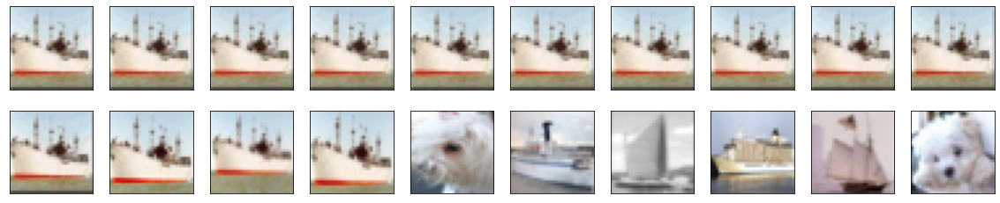

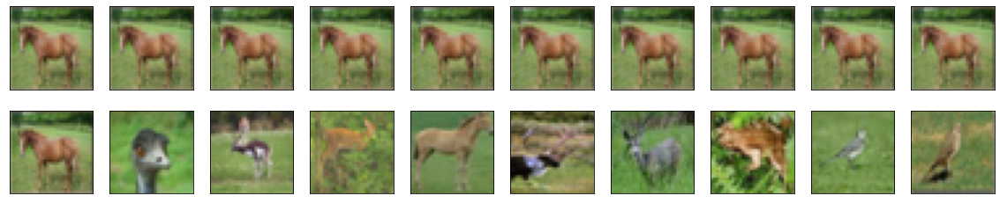

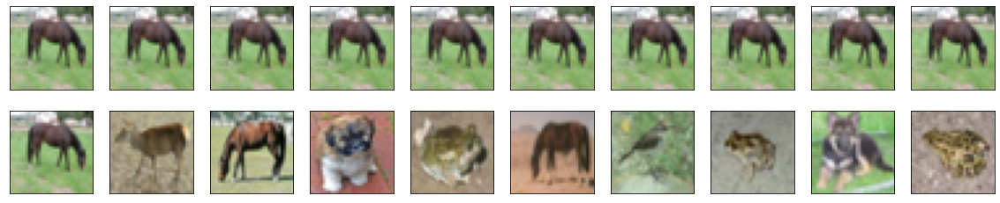

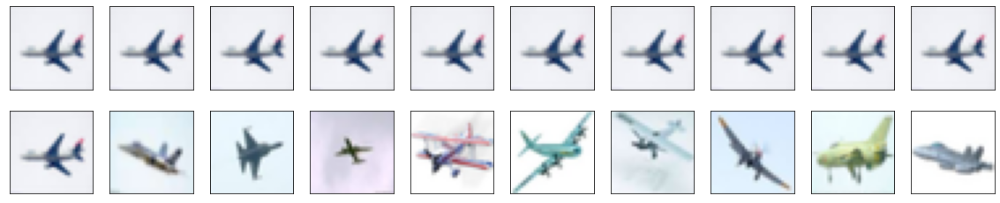

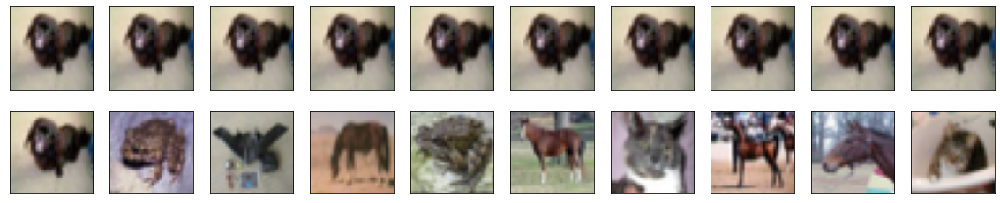

...

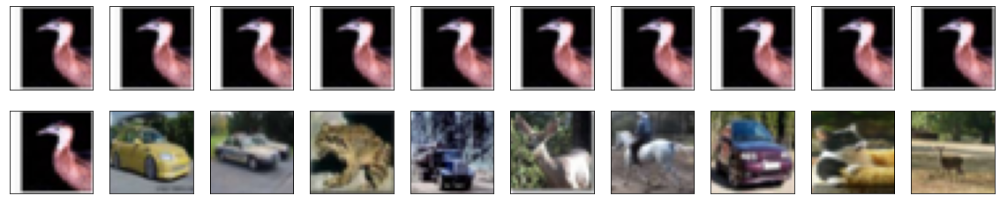

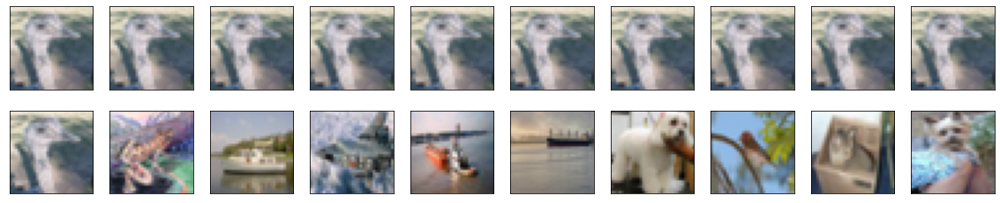

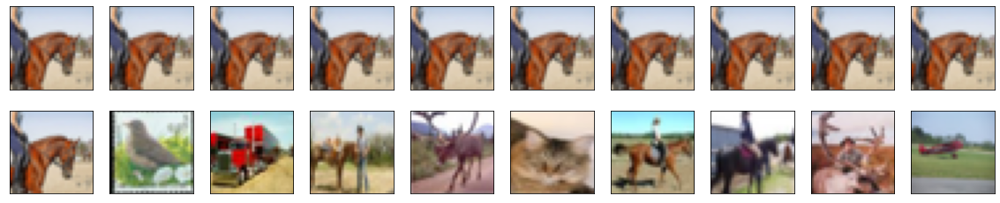

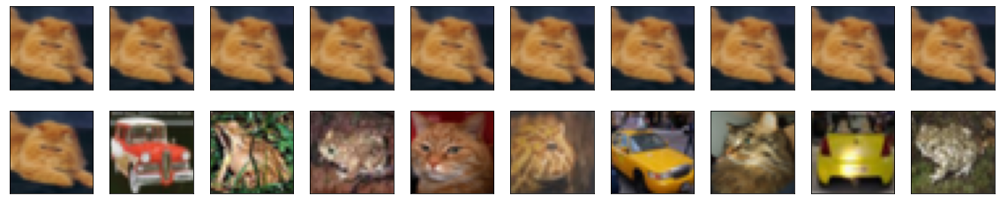

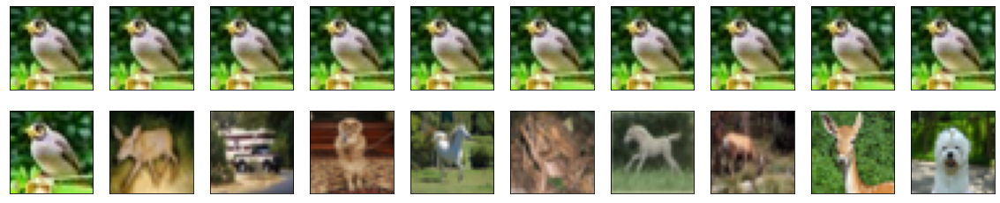

Plotting the similar images using the Manhattan distance


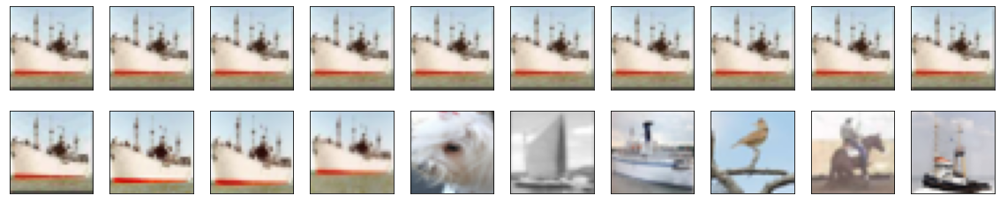

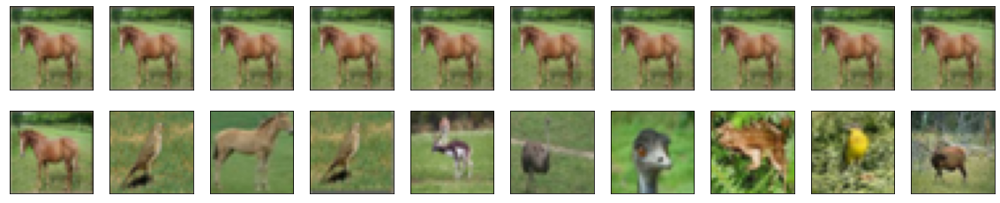

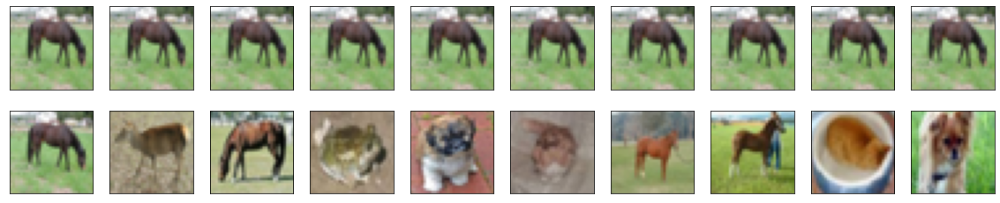

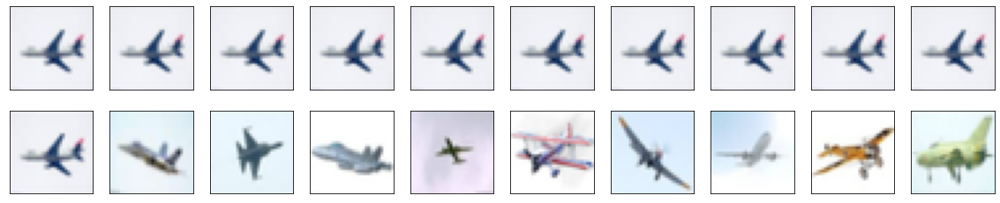

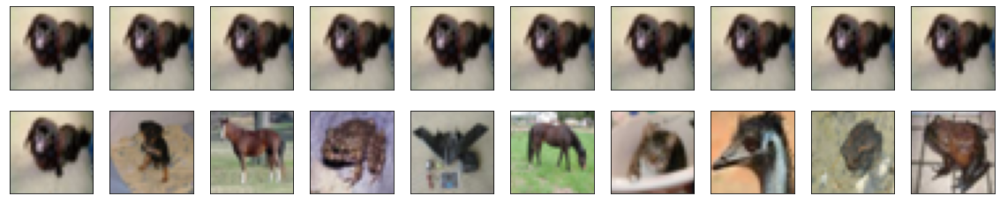

...

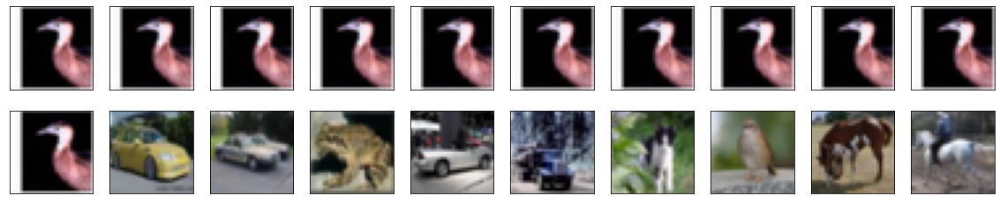

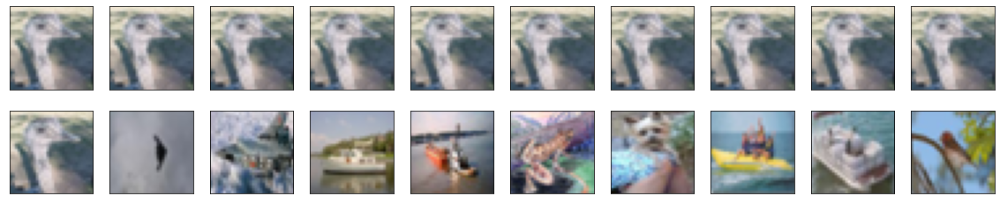

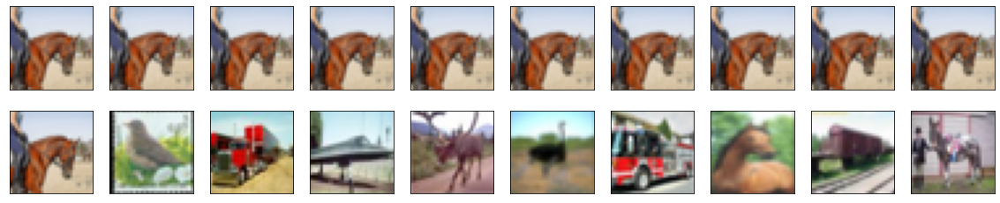

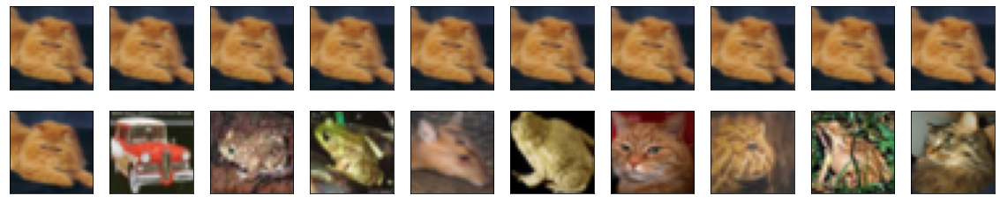

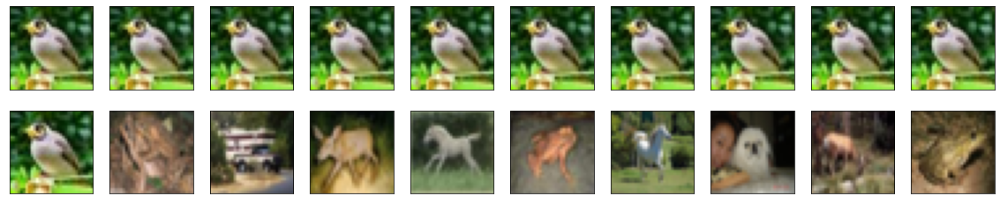

Plotting the similar images using the Cosine distance


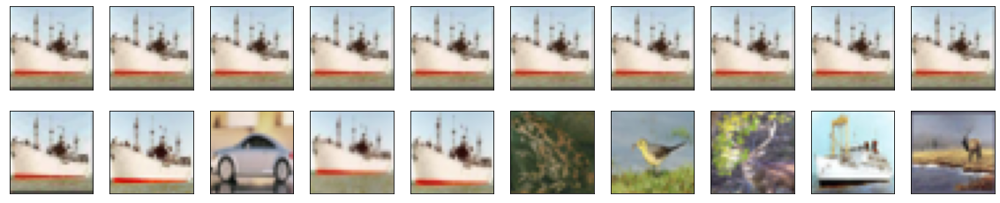

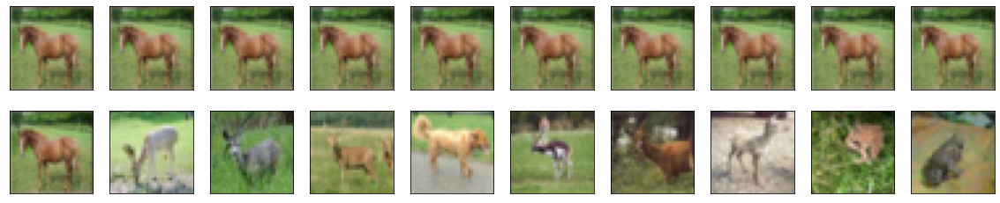

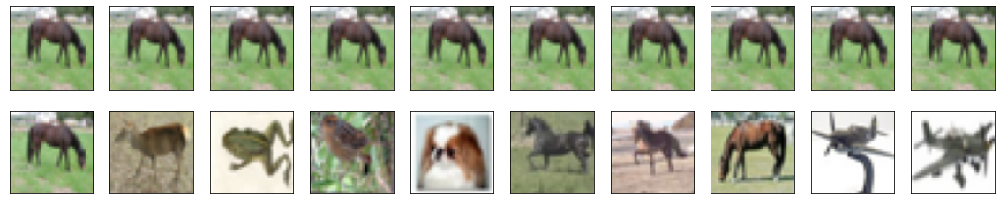

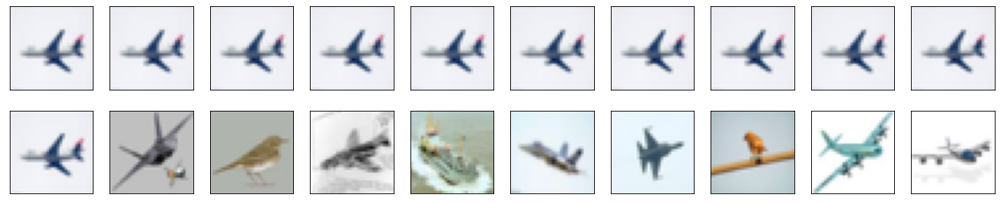

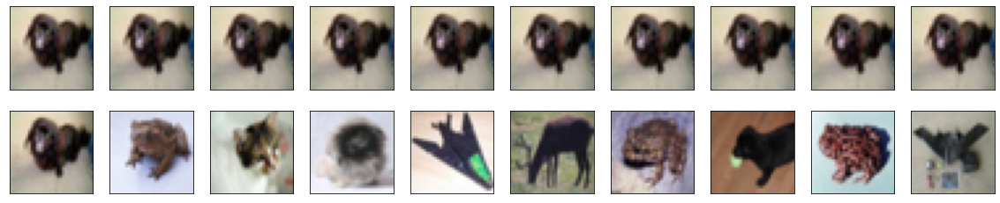

...

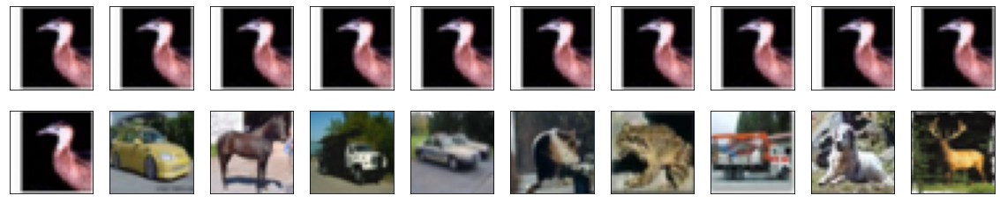

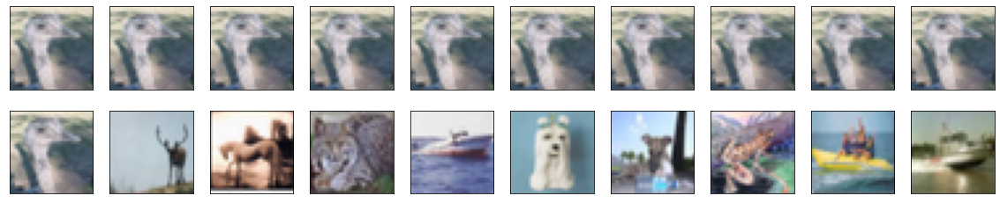

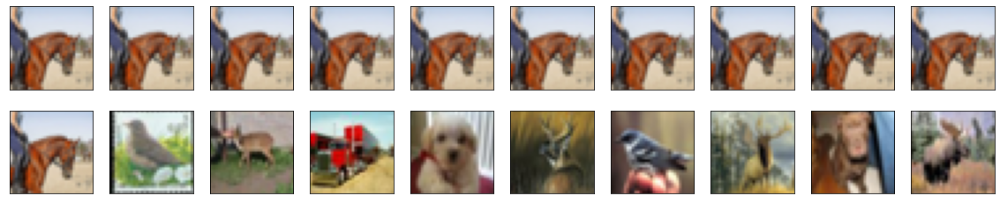

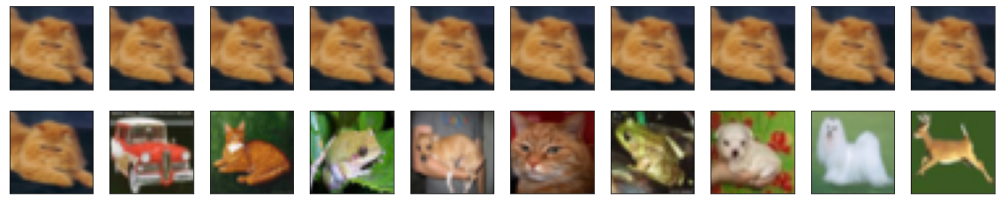

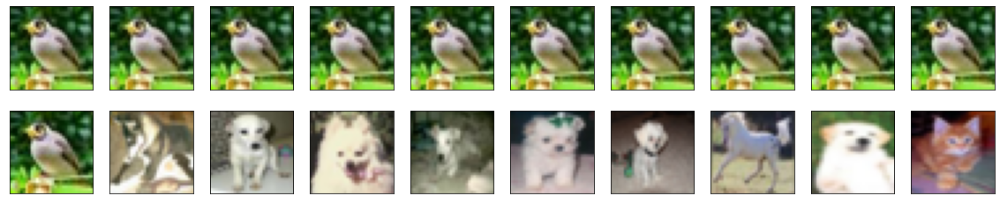

In [1]:
import tensorflow as tf
import numpy as np
from sklearn.metrics.pairwise import euclidean_distances, manhattan_distances, cosine_distances
import matplotlib.pyplot as plt

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0
x_dataset = np.concatenate((x_train, x_test), axis=0)


def load_encoder_model(model_name):
    """Loads the encoder model from the model saved during training."""
    auto_encoder = tf.keras.models.load_model(model_name)
    return tf.keras.models.Model(auto_encoder.input, auto_encoder.layers[13].output)


def plot_similar_images(similar_images, query_images):
    
    for i in range(20):
        index_list = similar_images[i]
        count = 1
        plt.figure(figsize=(20, 4))
        for index in index_list:
            
            ax = plt.subplot(2, 10, count)
            plt.imshow(query_images[i])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            ax = plt.subplot(2, 10, count + 10)
            plt.imshow(x_dataset[index])
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
            count = count + 1
        plt.show()


def data_query(encoder_model):
    """Randomly selects 20 image from the dataset.
       Encode the 20 images and the whole dataset using the encoder model.
       Compute the pairwise distance between each query encoding all the encodings in the whole dataset. """
    query_images = x_test[np.random.choice(10000, size=20, replace=False)]
    query_encodings = encoder_model.predict(query_images)

    dataset_encodings = encoder_model.predict(x_dataset)

    similar_images_euclidean = []
    similar_images_manhattan = []
    similar_images_cosine = []

    for i in range(0, 20):      #TODO: Comment out the other two distance metrics once the metric to be used is finalized
        dist_euclidean = euclidean_distances(query_encodings[i].reshape(1, 10), dataset_encodings)
        dist_euclidean = dist_euclidean[0]
        indices_euclidean = sorted(range(len(dist_euclidean)), key=lambda sub: dist_euclidean[sub])[:10]
        similar_images_euclidean.append(indices_euclidean)

        dist_manhattan = manhattan_distances(query_encodings[i].reshape(1, 10), dataset_encodings)
        dist_manhattan = dist_manhattan[0]
        indices_manhattan = sorted(range(len(dist_manhattan)), key=lambda sub: dist_manhattan[sub])[:10]
        similar_images_manhattan.append(indices_manhattan)

        dist_cosine = cosine_distances(query_encodings[i].reshape(1, 10), dataset_encodings)
        dist_cosine = dist_cosine[0]
        indices_cosine = sorted(range(len(dist_cosine)), key=lambda sub: dist_cosine[sub])[:10]
        similar_images_cosine.append(indices_cosine)

    print("Plotting the similar images using the Eucledian distance")
    plot_similar_images(similar_images_euclidean, query_images) 
    print("Plotting the similar images using the Manhattan distance")
    plot_similar_images(similar_images_manhattan, query_images)
    print("Plotting the similar images using the Cosine distance")
    plot_similar_images(similar_images_cosine, query_images)


if __name__ == "__main__":
    model = load_encoder_model('AutoEncoder_Final.hdf5')
    data_query(model)


# New Section